<a href="https://colab.research.google.com/github/SusrutPatole/Deep-Learning-based-Short-Term-Crop-Price-Forecasting/blob/main/Major_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h6 align = 'center'>
    <b>
        <!-- &nbsp; -->
    </b>
</h6>

<h1 align = 'center'>
    <b>
        BTech Project [CT2409]
    </b>
</h1>

<h2 align = 'center'>
    <b>
        Deep Learning based short-term forecasting of orange and cotton crop prices in the context of the Indian market.
    </b>
</h2>

#### **Group: B1**

| Enrollment Number | Student Name |
| :--: | :--------------: |
| 20010635 | Humanshu D G |
| 20010522 | Susrut Patole |

<!-- | 20010191 | Geetika Mahant |
| 20010732 | Neha Thakur | -->

In [ ]:
# @title ## 0.1 Standard Library Imports

import numpy as np, pandas as pd, scipy as sp, matplotlib as mpl, seaborn as sns, plotly.express as px
from datetime import datetime

%matplotlib inline

# **1. Get the Data**

In [ ]:
# @title ## 1.1 Importing Dataset

orange_2018_2022 = pd.read_csv("https://raw.githubusercontent.com/HumanshuDG/BTech-Project/main/Data/orange_2018_2022.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
print("Orange:", orange_2018_2022.shape)

cotton_2018_2022 = pd.read_csv("https://raw.githubusercontent.com/HumanshuDG/BTech-Project/main/Data/cotton_2018_2022.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
print("Cotton:", cotton_2018_2022.shape)

Orange: (58329, 8)
Cotton: (106747, 8)


In [ ]:
# @title &nbsp;

# # Orange Dataset
# # orange_2023 = pd.read_csv("/content/orange_2023.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # orange_2022 = pd.read_csv("/content/orange_2022.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # orange_2021 = pd.read_csv("/content/orange_2021.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # orange_2020 = pd.read_csv("/content/orange_2020.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # orange_2019 = pd.read_csv("/content/orange_2019.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# orange_2018_2022 = pd.read_csv("https://raw.githubusercontent.com/HumanshuDG/BTech-Project/main/Data/orange_2018_2022.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # orange_2018_2022['arrival_date'] = pd.to_datetime(orange_2018_2022['arrival_date'])
# # orange_2018_2022.set_index('date', inplace=True)

# # Cotton Dataset
# # cotton_2023 = pd.read_csv("/content/cotton_2023.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # cotton_2022 = pd.read_csv("/content/cotton_2022.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # cotton_2021 = pd.read_csv("/content/cotton_2021.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # cotton_2020 = pd.read_csv("/content/cotton_2020.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # cotton_2019 = pd.read_csv("/content/cotton_2019.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# cotton_2018_2022 = pd.read_csv("https://raw.githubusercontent.com/HumanshuDG/BTech-Project/main/Data/cotton_2018_2022.csv", index_col = "arrival_date", parse_dates = True, dayfirst = True)
# # cotton_2018_2022['arrival_date'] = pd.to_datetime(cotton_2018_2022['arrival_date'])
# # cotton_2018_2022.set_index('date', inplace=True)

# # print("Orange:", orange_2018.shape, orange_2019.shape, orange_2020.shape, orange_2021.shape, orange_2022.shape, orange_2023.shape)
# print("Orange:", orange_2018_2022.shape)
# # print("Cotton:", cotton_2018.shape, cotton_2019.shape, cotton_2020.shape, cotton_2021.shape, cotton_2022.shape, cotton_2023.shape)
# print("Cotton:", cotton_2018_2022.shape)

In [ ]:
arrival_date_orange = orange_2018_2022.index
arrival_date_orange

DatetimeIndex(['2018-08-20', '2018-08-22', '2018-08-24', '2018-08-27',
               '2018-01-25', '2018-01-27', '2018-01-28', '2018-01-30',
               '2018-01-31', '2018-02-01',
               ...
               '2022-12-27', '2022-12-28', '2022-12-28', '2022-12-28',
               '2022-12-29', '2022-12-29', '2022-12-29', '2022-12-30',
               '2022-12-30', '2022-12-30'],
              dtype='datetime64[ns]', name='arrival_date', length=58329, freq=None)

In [ ]:
cotton_2018_2022.head()

,state,district,market,commodity,variety,min_price,max_price,modal_price
arrival_date,,,,,,,,
2018-08-20,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-08-22,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-08-24,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-08-27,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-01-25,Chattisgarh,Durg,Durg,Orange,Other,3000.0,5000.0,4000.0


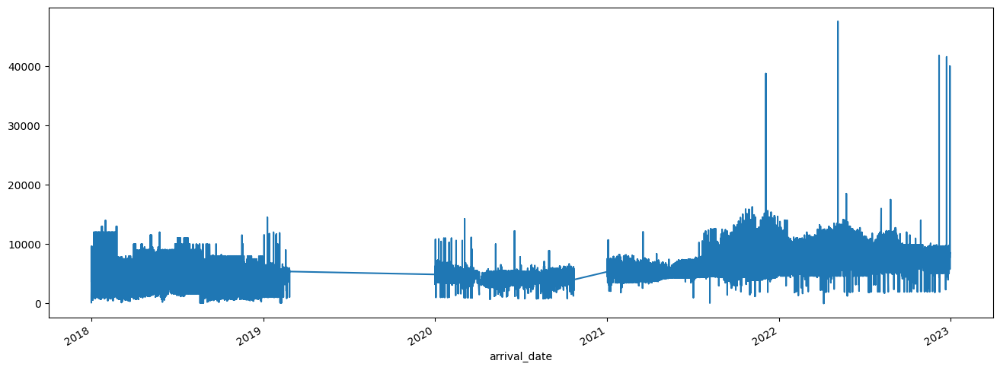

In [ ]:
cotton_2018_2022['modal_price'].plot(figsize = (16, 6));

In [ ]:
px.line(cotton_2018_2022['modal_price']).show()

In [ ]:
orange_2018_2022.head()

,state,district,market,commodity,variety,min_price,max_price,modal_price
arrival_date,,,,,,,,
2018-08-20,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-08-22,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-08-24,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-08-27,Andaman and Nicobar,South Andaman,Port Blair,Orange,Medium,90.0,100.0,95.0
2018-01-25,Chattisgarh,Durg,Durg,Orange,Other,3000.0,5000.0,4000.0


In [ ]:
px.line(orange_2018_2022['modal_price']).show()

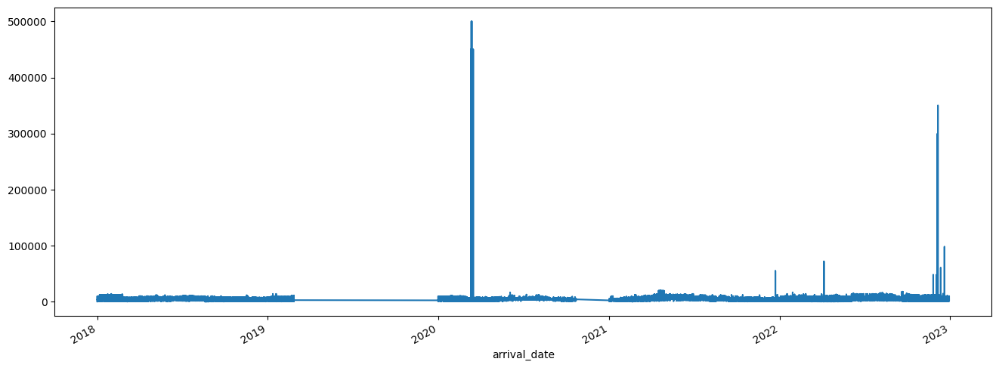

In [ ]:
orange_2018_2022['modal_price'].plot(figsize = (16, 6));

In [ ]:
# numerical_features = orange_2018_2022.select_dtypes(include = ['int64', 'float64']).columns.tolist()
# categorical_features = orange_2018_2022.select_dtypes(include = ['object']).columns.tolist()
# orange_2018_2022.drop(columns = categorical_features, inplace = True)

In [ ]:
# orange_2018_2022.head()

In [ ]:
# @title Install StatsModels
! pip install statsmodels

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 45.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 19.8 MB/s eta 0:00:00


In [ ]:
# @title ### Stationarity Test using ADF (Augmented Dickey-Fuller) test

from statsmodels.tsa.stattools import adfuller
def ad_test(dataset):
     dftest = adfuller(dataset, autolag = 'AIC')
     print("ADF:", dftest[0])
     print("p-Value:", dftest[1])
     print("Number of Lags:", dftest[2])
     print("Num Of Observations Used For ADF Regression:", dftest[3])
     print("Critical Values:")
     for key, val in dftest[4].items():
         print("\t", str(key)+":", val)
ad_test(orange_2018_2022['modal_price'])

ADF: -19.709403365352465
p-Value: 0.0
Number of Lags: 59
Num Of Observations Used For ADF Regression: 58269
Critical Values:
	 1%: -3.4304622309993493
	 5%: -2.861589603951926
	 10%: -2.5667964025160455


# **2. Preprocessing**

## 2.2 Data Imputation

In [ ]:
# @title Show null in orange

# print("Orange 2023:", orange_2023.isnull().sum(),\
#       "Orange 2022:", orange_2022.isnull().sum(),\
#       "Orange 2021:", orange_2021.isnull().sum(),\
#       "Orange 2020:", orange_2020.isnull().sum(),\
#       "Orange 2019:", orange_2019.isnull().sum(),\
#       "Orange 2018:", orange_2018.isnull().sum(),
#       sep = '\n\n')

print("Null values in orange data:")
print(orange_2018_2022.isnull().sum())

Null values in orange data:
state           0
district        0
market          0
commodity       0
variety         0
min_price      39
max_price      44
modal_price     0
dtype: int64


In [ ]:
# @title Show null in cotton

# print("Cotton 2023:", cotton_2023.isnull().sum(),\
#       "Cotton 2022:", cotton_2022.isnull().sum(),\
#       "Cotton 2021:", cotton_2021.isnull().sum(),\
#       "Cotton 2020:", cotton_2020.isnull().sum(),\
#       "Cotton 2019:", cotton_2019.isnull().sum(),\
#       "Cotton 2018:", cotton_2018.isnull().sum(),\
#       sep = '\n\n')

print("Null values in cotton data:")
print(cotton_2018_2022.isnull().sum())

Null values in cotton data:
state            0
district         0
market           0
commodity        0
variety          0
min_price      116
max_price      122
modal_price      0
dtype: int64


## 2.2.1 Preprocessing Pipeline

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder, LabelEncoder, OneHotEncoder, QuantileTransformer

In [ ]:
numerical_features = orange_2018_2022.select_dtypes(include = ['int64', 'float64']).columns.tolist()
categorical_features = orange_2018_2022.select_dtypes(include = ['object']).columns.tolist()

num_estimators = [
    ('simple_imputer', SimpleImputer(missing_values = np.nan, strategy = 'mean')),
    ('standard_scaler', StandardScaler()),
    ('quantile_transformer', QuantileTransformer())
]
num_pipeline = Pipeline(steps = num_estimators)

cat_estimators = [
    ('ordinal_encoder', OrdinalEncoder())
]
cat_pipeline = Pipeline(steps = cat_estimators)

preprocessing_pipe = ColumnTransformer([
    ('cat_pipeline', cat_pipeline, categorical_features),
    ('num_pipeline', num_pipeline, numerical_features)
])

In [ ]:
from sklearn import set_config

# displays HTML representation in a jupyter context
set_config(display = 'diagram')

preprocessing_pipe

ColumnTransformer(transformers=[('cat_pipeline',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['state', 'district', 'market', 'commodity',
                                  'variety']),
                                ('num_pipeline',
                                 Pipeline(steps=[('simple_imputer',
                                                  SimpleImputer()),
                                                 ('standard_scaler',
                                                  StandardScaler()),
                                                 ('quantile_transformer',
                                                  QuantileTransformer())]),
                                 ['min_price', 'max_price', 'modal_price'])])

## Outlier Adjustment

In [ ]:
from scipy import stats

In [ ]:
modal_price_orange = pd.DataFrame(orange_2018_2022['modal_price'])
orange_2018_2022 = orange_2018_2022[(np.abs(stats.zscore(modal_price_orange)) < 3).all(axis=1)]
print(orange_2018_2022.shape)
px.line(orange_2018_2022['modal_price']).show()

(58295, 8)


In [ ]:
modal_price_cotton = pd.DataFrame(cotton_2018_2022['modal_price'])
cotton_2018_2022 = cotton_2018_2022[(np.abs(stats.zscore(modal_price_cotton)) < 3).all(axis=1)]
print(cotton_2018_2022.shape)
px.line(cotton_2018_2022['modal_price']).show()

(106645, 8)


### 2.2.1 Data Imputation on `orange_2023`

In [ ]:
orange_2018_2022.replace('nan', np.nan, inplace = True)
orange_2018_2022 = pd.DataFrame(orange_2018_2022)

num = orange_2018_2022.select_dtypes(include = ['int64', 'float64']).columns.tolist()
cat = orange_2018_2022.select_dtypes(include = ['object']).columns.tolist()

cat_data = orange_2018_2022[cat]

# oe = OneHotEncoder()
# # state	district	market	commodity	variety
# orange_2023_s = oe.fit_transform(orange_2018_2022['state'].reshape(-1, 1))
# orange_2023_d = oe.fit_transform(orange_2018_2022['district'])
# orange_2023_m = oe.fit_transform(orange_2018_2022['market'])
# orange_2023_c = oe.fit_transform(orange_2018_2022['commodity'])
# orange_2023_v = oe.fit_transform(orange_2018_2022['variety'])


ohe = OneHotEncoder()
cat_encoded = ohe.fit_transform(cat_data)
cat_encoded_df = pd.DataFrame(cat_encoded.toarray(), columns=ohe.get_feature_names_out(cat))
orange_2018_2022 = pd.concat([cat_encoded_df, orange_2018_2022[num].reset_index(drop=True)], axis=1)


# # enc_orange_2023_df = pd.DataFrame(orange_2018_2022.toarray(), columns = oe.get_feature_names_out(num))
# orange_2018_2022 = pd.concat([orange_2023_s, orange_2023_d, orange_2023_m, orange_2023_c, orange_2023_v, orange_2018_2022[num]], axis = 1)
# # orange_2023.drop(cat, axis = 1, inplace = True)

# # ss = StandardScaler()
# # orange_2023[num] = ss.fit_transform(orange_2023[num])


orange_2018_2022.set_index(arrival_date_orange, inplace=True)
orange_2018_2022.head()

,state_Andaman and Nicobar,state_Bihar,state_Chattisgarh,state_Goa,state_Gujarat,state_Haryana,state_Himachal Pradesh,state_Jammu and Kashmir,state_Jharkhand,state_Karnataka,...,market_kalanwali,commodity_Orange,variety_Darjeeling,variety_Medium,variety_Nagpuri,variety_Orange,variety_Other,min_price,max_price,modal_price
arrival_date,,,,,,,,,,,,,,,,,,,,,
2018-08-20,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,90.0,100.0,95.0
2018-08-22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,90.0,100.0,95.0
2018-08-24,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,90.0,100.0,95.0
2018-08-27,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,90.0,100.0,95.0
2018-01-25,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3000.0,5000.0,4000.0


In [ ]:
orange_2018_2022.shape

(58329, 643)

In [ ]:
num = orange_2018_2022.select_dtypes(include = ['int64', 'float64']).columns.tolist()

si = SimpleImputer(strategy = "mean")
orange_2018_2022[num] = si.fit_transform(orange_2018_2022[num])

In [ ]:
# mpl.pyplot.figure(figsize = (20, 20))
# sns.heatmap(orange_2018_2022.corr(), annot = True, square = True, cmap='RdBu');

### 2.2.1 (Alternative) Data Imputation on `orange_2023`

In [ ]:
# X = preprocessing_pipe.fit_transform(X)
# X = pd.DataFrame(X)
# X.head()

## Dropping Duplicates

In [ ]:
# print("Duplicated values in orange dataset: ", orange_2018_2022.duplicated().sum())
# orange_2018_2022 = orange_2018_2022.drop_duplicates()
# orange_2018_2022.shape

## 2.3 Splitting the Data for training

## 2.1 Separating features and labels

In [ ]:
y, X = orange_2018_2022.pop('modal_price'), orange_2018_2022.drop(["min_price", "max_price"], axis = 1)

X.shape, y.shape

((58329, 640), (58329,))

In [ ]:
num = X.select_dtypes(include = ['int64', 'float64']).columns.tolist()
cat = X.select_dtypes(include = ['object']).columns.tolist()

print(num, cat)
# knn = KNNImputer(n_neighbors = 10)
# X[num] = knn.fit_transform(X[num])

# qt = QuantileTransformer(output_distribution = 'uniform')
# orange_2018_2022[num] = qt.fit_transform(X[num])

['state_Andaman and Nicobar', 'state_Bihar', 'state_Chattisgarh', 'state_Goa', 'state_Gujarat', 'state_Haryana', 'state_Himachal Pradesh', 'state_Jammu and Kashmir', 'state_Jharkhand', 'state_Karnataka', 'state_Kerala', 'state_Madhya Pradesh', 'state_Maharashtra', 'state_Manipur', 'state_Meghalaya', 'state_Mizoram', 'state_NCT of Delhi', 'state_Nagaland', 'state_Odisha', 'state_Punjab', 'state_Rajasthan', 'state_Telangana', 'state_Tripura', 'state_Uttar Pradesh', 'state_Uttrakhand', 'state_West Bengal', 'district_Agra', 'district_Ahmedabad', 'district_Ahmednagar', 'district_Aizawl', 'district_Ajmer', 'district_Alappuzha', 'district_Aligarh', 'district_Allahabad', 'district_Alwar', 'district_Amarawati', 'district_Ambala', 'district_Ambedkarnagar', 'district_Amreli', 'district_Amritsar', 'district_Anantnag', 'district_Angul', 'district_Araria', 'district_Auraiya', 'district_Aurangabad', 'district_Azamgarh', 'district_Badaun', 'district_Badgam', 'district_Baghpat', 'district_Bahraich', 'd

### Feature Selection: PCA

In [ ]:
from sklearn.decomposition import PCA

n_components = 10

pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X)
print(X_pca)

explained_variance_ratio = pca.explained_variance_ratio_
print(f'Explained Variance Ratio: {explained_variance_ratio}')

principal_components = pd.DataFrame(data = X_pca, columns=[f'PC{i+1}' for i in range(n_components)])
principal_components.set_index(arrival_date_orange, inplace = True)
print('Principal Components:')
print(principal_components.head())

[[ 0.24038149 -0.19806491  0.12996429 ...  0.0381791   0.10595877
  -0.1854113 ]
 [ 0.24038149 -0.19806491  0.12996429 ...  0.0381791   0.10595877
  -0.1854113 ]
 [ 0.24038149 -0.19806491  0.12996429 ...  0.0381791   0.10595877
  -0.1854113 ]
 ...
 [-0.52421485 -0.23105329  0.05685864 ... -0.4091874  -0.68455825
   1.05591275]
 [-0.52421485 -0.23105329  0.05685864 ... -0.4091874  -0.68455825
   1.05591275]
 [-0.52421485 -0.23105329  0.05685864 ... -0.4091874  -0.68455825
   1.05591275]]
Explained Variance Ratio: [0.13344538 0.05034774 0.04577    0.03671684 0.03275688 0.03077532
 0.02618242 0.02214054 0.02025857 0.01766272]
Principal Components:
                   PC1       PC2       PC3       PC4       PC5       PC6  \
arrival_date                                                               
2018-08-20    0.240381 -0.198065  0.129964 -0.143115  0.101549  0.080767   
2018-08-22    0.240381 -0.198065  0.129964 -0.143115  0.101549  0.080767   
2018-08-24    0.240381 -0.198065  0.129964 

In [ ]:
principal_components.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
arrival_date,,,,,,,,,,
2018-08-20,0.240381,-0.198065,0.129964,-0.143115,0.101549,0.080767,0.04385,0.038179,0.105959,-0.185411
2018-08-22,0.240381,-0.198065,0.129964,-0.143115,0.101549,0.080767,0.04385,0.038179,0.105959,-0.185411
2018-08-24,0.240381,-0.198065,0.129964,-0.143115,0.101549,0.080767,0.04385,0.038179,0.105959,-0.185411
2018-08-27,0.240381,-0.198065,0.129964,-0.143115,0.101549,0.080767,0.04385,0.038179,0.105959,-0.185411
2018-01-25,-0.447697,-0.090065,-0.040356,-0.108100,0.093931,-0.010127,0.10910,0.359969,0.008742,0.066194


In [ ]:
pc_corr = principal_components.corr()

[(0.35294117647058826, 0.19215686274509805, 0.7411764705882353, 1), (0.49019607843137253, 0.3686274509803922, 0.7019607843137254, 1), (0.996078431372549, 0.5333333333333333, 0.11764705882352941, 1), (0.6509803921568628, 0.4117647058823529, 0.8392156862745098, 1), (0.6, 0.6823529411764706, 0.33725490196078434, 1), (0.1843137254901961, 0.9254901960784314, 0.5058823529411764, 1), (0.9372549019607843, 0.4823529411764706, 0.13333333333333333, 1), (0.5686274509803921, 0.9450980392156862, 0.8509803921568627, 1), (0.8823529411764706, 0.09411764705882353, 0.996078431372549, 1), (0.8274509803921568, 0.3568627450980392, 0.9921568627450981, 1), (0.38823529411764707, 0.0, 0.1607843137254902, 1), (0.8470588235294118, 0.403921568627451, 0.8196078431372549, 1), (0.6078431372549019, 0.24705882352941178, 0.4117647058823529, 1), (0.08235294117647059, 0.6588235294117647, 0.8313725490196079, 1), (0.4666666666666667, 0.0392156862745098, 0.2784313725490196, 1), (0.6313725490196078, 0.5137254901960784, 0.4705

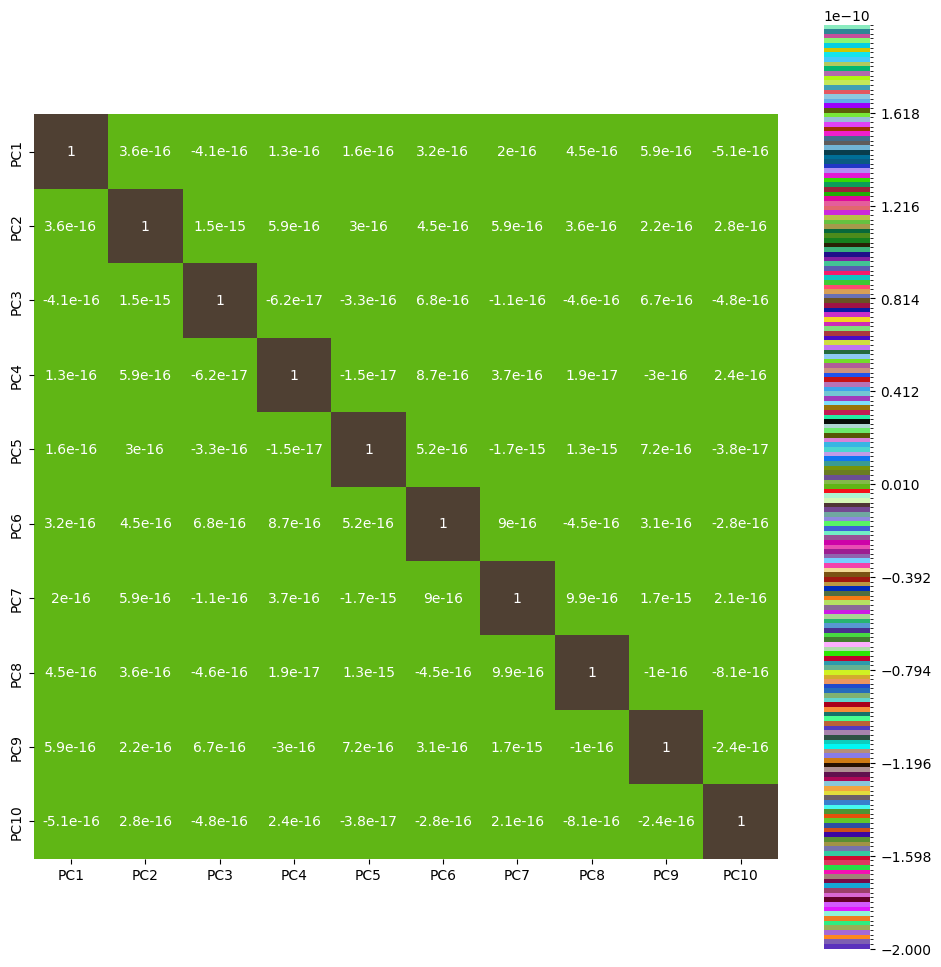

In [ ]:
from matplotlib.colors import BoundaryNorm, ListedColormap

# colors = ['#02ab2e', 'gold', 'orange', 'red', 'darkred']
bounds = np.linspace(-2e-10, 2e-10, num = int(2e2))
colors = [list(np.random.choice(range(256), size = 3)) for i in range(len(bounds))]
colors = [(r/255, g/255, b/255, 1) for r, g, b in colors]
print(colors)
norm = BoundaryNorm(bounds, ncolors = len(colors))
custom_cmap = ListedColormap(colors)


mpl.pyplot.figure(figsize = (12, 12))
sns.heatmap(pc_corr, annot = True, square = True, cmap = custom_cmap, norm = norm);

### Spliting the dataset

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1127)

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score

X_train, X_test, y_train, y_test = train_test_split(principal_components, y, test_size = 0.001, shuffle = False, random_state = 1127)
print(X_train.shape, X_test.shape)

(58095, 10) (234, 10)


In [ ]:
X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,58095.0,0.002111,0.681346,-0.705121,-0.539274,-0.498282,0.768234,1.140785
PC2,58095.0,0.000931,0.418753,-0.770957,-0.275533,-0.097021,0.287222,1.304029
PC3,58095.0,-0.000229,0.399492,-0.741450,-0.301095,-0.061363,0.244472,0.829785
PC4,58095.0,0.001482,0.357057,-0.810879,-0.162991,-0.045996,0.123058,0.874225
PC5,58095.0,-0.001337,0.337317,-0.724099,-0.240971,0.019507,0.223303,0.827871
PC6,58095.0,-0.001017,0.327201,-0.822308,-0.228749,0.009565,0.220706,0.942050
PC7,58095.0,-0.000033,0.302162,-0.687368,-0.155780,-0.021336,0.110331,1.071474
PC8,58095.0,0.001648,0.276641,-0.837648,-0.062432,-0.028280,0.040898,1.265809
PC9,58095.0,0.002757,0.262201,-0.684558,-0.130565,0.051126,0.165191,0.767326
PC10,58095.0,-0.004253,0.238921,-0.924919,-0.021179,0.001328,0.082865,1.055913


# 4. Candidate Algorithms

In [ ]:
from sklearn.model_selection import GridSearchCV

best_accuracy = 0.0
best_classifier = 0
best_pipeline = ''

## 4.1 Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.pipeline import Pipeline

pipeline_lr = Pipeline([('lr_classifier', LinearRegression(copy_X = True))])

In [ ]:
lr = LinearRegression(fit_intercept = True, n_jobs = 8)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
# y_pred_ = qt.inverse_transform(y_pred)

print(y_pred)

print(lr, '\nScore:', lr.score(X_test, y_test), '\nMAE:', mean_absolute_error(y_test, y_pred), '\nMSE:', mean_squared_error(y_test, y_pred), '\nRMSE:', mean_squared_error(y_test, y_pred, squared = False))

[5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.68832351 5347.68832351 5347.68832351 5347.68832351 5347.68832351
 5347.

In [ ]:
score_ = cross_val_score(lr, X_train, y_train, cv = 10).mean()
print('Cross Validation Score:', score_)

Cross Validation Score: 0.08851423612827332


## 4.2 SVR

In [ ]:
from sklearn.svm import SVR

### 4.2.1 SVR - Linear Kernel

In [ ]:
svr_lin = SVR(kernel = 'linear')

In [ ]:
svr_lin.fit(X_train, y_train)
y_pred_svr_lin = svr_lin.predict(X_test)

print(svr_lin, '\nScore:', svr_lin.score(X_test, y_test), '\nMAE:', mean_absolute_error(y_test, y_pred_svr_lin), '\nMSE:', mean_squared_error(y_test, y_pred_svr_lin), '\nRMSE:', mean_squared_error(y_test, y_pred_svr_lin, squared = False))

SVR(kernel='linear') 
Score: -0.35964893491538086 
MAE: 1436.415443857923 
MSE: 2691277.768880609 
RMSE: 1640.5114351569175


In [ ]:
print(y_pred_svr_lin)

[4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.30930318 4641.30930318 4641.30930318 4641.30930318 4641.30930318
 4641.

### 4.2.2 SVR - Polynomial Kernel

In [ ]:
svr_poly = SVR(kernel = 'poly', degree = 2, gamma = 'auto', cache_size = 200)

In [ ]:
svr_poly.fit(X_train, y_train)
y_pred_svr_poly = svr_poly.predict(X_test)

print(svr_poly, '\nScore:', svr_poly.score(X_test, y_test), '\nMAE:', mean_absolute_error(y_test, y_pred_svr_poly), '\nMSE:', mean_squared_error(y_test, y_pred_svr_poly), '\nRMSE:', mean_squared_error(y_test, y_pred_svr_poly, squared = False))

SVR(degree=2, gamma='auto', kernel='poly') 
Score: -1.6197545292239743 
MAE: 1919.3528807574423 
MSE: 5185520.279073776 
RMSE: 2277.173748108338


In [ ]:
print(y_pred_svr_poly)

[3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.47617269 3694.47617269 3694.47617269 3694.47617269 3694.47617269
 3694.

### 4.2.3 SVR - Radial Basis Function

In [ ]:
svr_rbf = SVR(kernel = 'rbf')

In [ ]:
svr_rbf.fit(X_train, y_train)
y_pred_svr_rbf = svr_rbf.predict(X_test)

print(svr_rbf, '\nScore:', svr_rbf.score(X_test, y_test), '\nMAE:', mean_absolute_error(y_test, y_pred_svr_rbf), '\nMSE:', mean_squared_error(y_test, y_pred_svr_rbf), '\nRMSE:', mean_squared_error(y_test, y_pred_svr_rbf, squared = False))

SVR() 
Score: -0.8506318302577969 
MAE: 1651.0906120383697 
MSE: 3663125.219500585 
RMSE: 1913.9292618852414


In [ ]:
print(y_pred_svr_rbf)

[4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.45514468 4187.45514468 4187.45514468 4187.45514468 4187.45514468
 4187.

## 4.3 AR

In [ ]:
from statsmodels.tsa.ar_model import AutoReg

# y_test.reset_index(drop=True, inplace=True)
# y_train.reset_index(drop=True, inplace=True)
freq = X_train.index.inferred_freq
ar = AutoReg(y_train, lags = [l for l in range(1, 11)]).fit(X_train)
ar.summary()

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [ ]:
X_test.index[0], X_test.index[-1]

(Timestamp('2022-01-31 00:00:00'), Timestamp('2022-12-30 00:00:00'))

In [ ]:
start_date = datetime.strptime(str(X_test.index[0]), "%Y-%m-%d %H:%M:%S")
end_date = datetime.strptime(str(X_test.index[-1]), "%Y-%m-%d %H:%M:%S")

start_index = X_test.index.get_loc(start_date)
end_index = X_test.index.get_loc(end_date)
print(start_date, start_index, end_date, end_index)

# end = X_test.index[-1]
if start_index > end_index:
    end_index, end_index = start_index, end_index
y_pred_ar = ar.predict(start = start_index, end = end_index).rename('AR Predictions')

2022-01-31 00:00:00 slice(0, 3, None) 2022-12-30 00:00:00 slice(231, 234, None)


In [ ]:
X_test[start_date:end_date]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
arrival_date,,,,,,,,,,
2022-01-31,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
2022-01-31,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
2022-01-31,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
2022-02-01,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
2022-02-01,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
...,...,...,...,...,...,...,...,...,...,...
2022-12-29,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
2022-12-29,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913
2022-12-30,-0.524215,-0.231053,0.056859,-0.367893,0.331915,0.252457,0.008257,-0.409187,-0.684558,1.055913


In [ ]:
y_pred_ar

arrival_date
2018-08-20   NaN
2018-08-22   NaN
2018-08-24   NaN
2018-08-27   NaN
2018-01-25   NaN
              ..
2018-03-21   NaN
2018-03-22   NaN
2018-03-24   NaN
2018-03-28   NaN
2018-03-29   NaN
Name: AR Predictions, Length: 234, dtype: float64

In [ ]:
print(ar,
      '\nMAE:', mean_absolute_error(y_test, y_pred_ar),
      '\nMSE:', mean_squared_error(y_test, y_pred_ar),
      '\nRMSE:', mean_squared_error(y_test, y_pred_ar, squared = False))

ValueError: Input contains NaN.

In [ ]:
y_test.shape, y_pred_ar.shape

((234,), (234,))

In [ ]:
y_test.isnull().sum(), y_pred_ar.isnull().sum()

(0, 234)

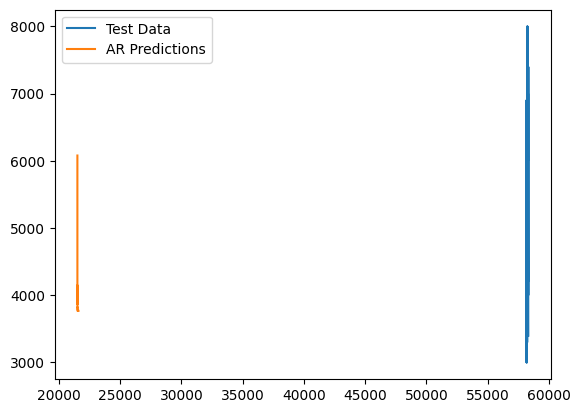

In [ ]:
# y_train.plot(legend=True, figsize=(24, 24), label='Training Data')
y_test.plot(legend=True, label='Test Data')

y_pred_ar.plot(legend=True, label='AR Predictions');

## 4.4 VAR

In [ ]:
# from statsmodels.tsa.statespace.varmax import VARMAX

# var = VARMAX(X_train, order = (10, 0), enforce_stationarity = True).fit()
# var.summary()

In [ ]:
# start = X_test.index[0]
# end = X_test.index[-1]
# if start > end:
#     start, end = end, start
# y_pred_var = var.get_prediction(start = start, end = end).rename('VAR Predictions')

In [ ]:
# print(var, '\nMAE:', mean_absolute_error(y_test, y_pred_var), '\nMSE:', mean_squared_error(y_test, y_pred_var), '\nRMSE:', mean_squared_error(y_test, y_pred_var, squared = False))

In [ ]:
# y_train.plot(legend=True, figsize=(24, 24), label='Training Data')
# y_test.plot(legend=True, label='Test Data')

# y_pred_var.plot(legend=True, label='VAR Predictions');
# # predictions.plot(legend = True)
# # test['modal_price'].plot(legend = True)

## 4.5 ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

arima = ARIMA(y_train, order = (1, 1, 1)).fit()
arima.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:            modal_price   No. Observations:                21503
Model:                 ARIMA(1, 1, 1)   Log Likelihood             -213766.828
Date:                Fri, 05 Apr 2024   AIC                         427539.657
Time:                        06:52:38   BIC                         427563.584
Sample:                             0   HQIC                        427547.458
                              - 21503                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5272      0.000   3982.254      0.000       0.527       0.527
ma.L1         -1.0000      0.000  -5200.696      0.000      -1.000      -1.000
sigma2      2.527e+07   6.28e-12   4.02e+18      0.000    2.53e+07    2.53e+07
===================================================================================
Ljung-Box (L1) (Q):                 412.18   Jarque-Bera (JB):       16517821336.82
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):              19.71   Skew:                            42.39
Prob(H) (two-sided):                  0.00   Kurtosis:                      4295.97
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 8.63e+30. Standard errors may be unstable.
"""

In [ ]:
start = X_test.index[0]
end = X_test.index[-1]
if start > end:
    start, end = end, start
y_pred_arima = arima.predict(start = start, end = end).rename('ARIMA Predictions')

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [ ]:
print(arima, '\nMAE:', mean_absolute_error(y_test, y_pred_arima), '\nMSE:', mean_squared_error(y_test, y_pred_arima), '\nRMSE:', mean_squared_error(y_test, y_pred_arima, squared = False))

MAE: 1853.0411748771185 
MSE: 4780097.019142201 
RMSE: 2186.3432985563363


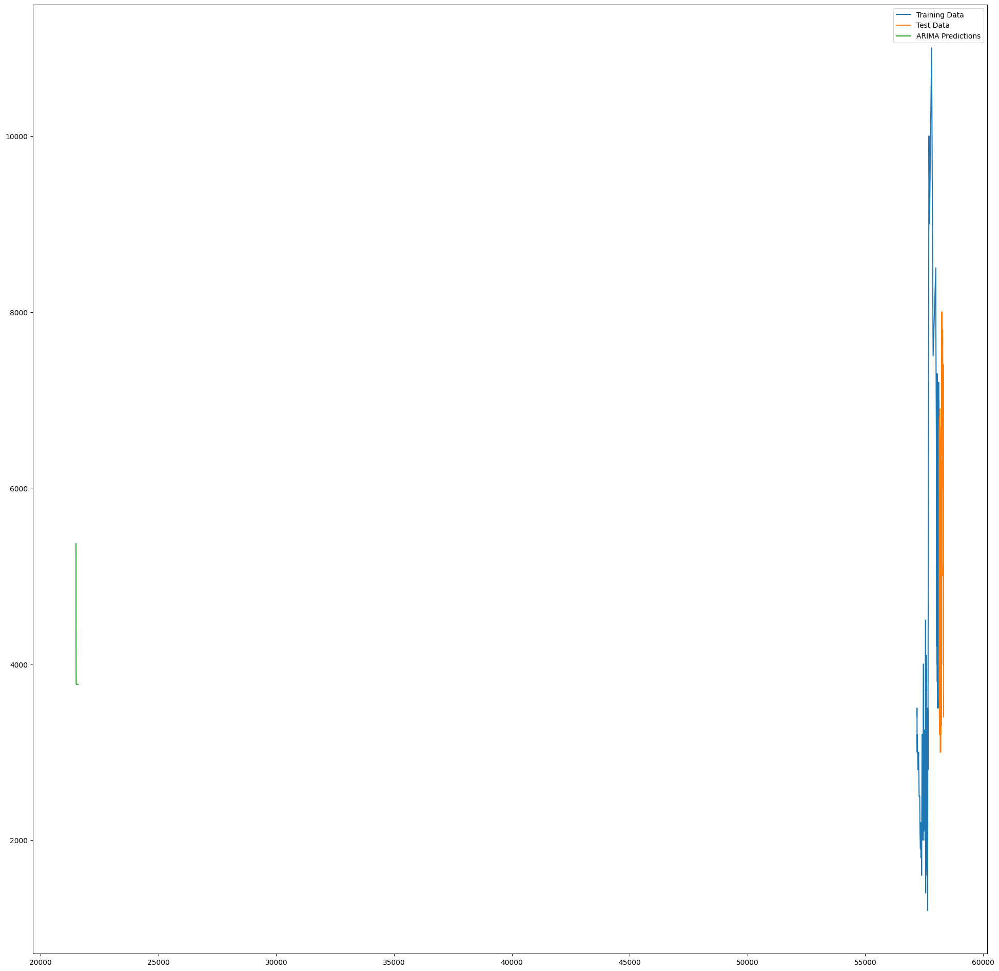

In [ ]:
y_train[-200:].plot(legend=True, figsize=(24, 24), label='Training Data')
y_test.plot(legend=True, label='Test Data')

y_pred_arima.plot(legend=True, label='ARIMA Predictions');
# predictions.plot(legend = True)
# test['modal_price'].plot(legend = True)

## 4.6 LSTM

In [ ]:
from keras.preprocessing.sequence import TimeseriesGenerator

n_input = X_train.shape[1]
n_features = X_train.shape[1]
gen = TimeseriesGenerator(X_train, y_train, length = n_input, batch_size = 4)

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Assuming X_train is of shape (21503, 10) and y_train is of shape (87, 1)
# Extract values from DataFrame
X_train_values = X_train.values
y_train_values = y_train.values

# Reshape X_train to have 3 dimensions: (batch_size, timesteps, features)
X_train_reshaped = X_train_values.reshape((X_train_values.shape[0], X_train_values.shape[1], 1))

# Define the LSTM model
lstm = Sequential()
lstm.add(LSTM(20, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])))
lstm.add(Dense(1))
lstm.compile(optimizer='adam', loss='mse')

# Train the model
lstm.fit(X_train_reshaped, y_train, epochs = 10, batch_size = 4)

Epoch 1/10
5376/5376 [==============================] - 26s 4ms/step - loss: 48804244.0000
Epoch 2/10
5376/5376 [==============================] - 23s 4ms/step - loss: 48160184.0000
Epoch 3/10
5376/5376 [==============================] - 23s 4ms/step - loss: 47513708.0000
Epoch 4/10
5376/5376 [==============================] - 23s 4ms/step - loss: 46906040.0000
Epoch 5/10
5376/5376 [==============================] - 23s 4ms/step - loss: 46320812.0000
Epoch 6/10
5376/5376 [==============================] - 24s 4ms/step - loss: 45737196.0000
Epoch 7/10
5376/5376 [==============================] - 24s 4ms/step - loss: 45178628.0000
Epoch 8/10
5376/5376 [==============================] - 23s 4ms/step - loss: 44659384.0000
Epoch 9/10
5376/5376 [==============================] - 23s 4ms/step - loss: 44110200.0000
Epoch 10/10
5376/5376 [==============================] - 23s 4ms/step - loss: 43610460.0000


In [ ]:
# Convert DataFrame to numpy array
X_test_values = X_test.values

# Reshape X_test_values to (samples, time steps, features)
# X_test_reshaped = X_test_values.reshape(X_test_values.shape[0], 1, X_test_values.shape[1])
X_test_reshaped = X_test_values.reshape(X_test_values.shape[0], X_test_values.shape[1], 1)


# Make predictions
y_pred_lstm = lstm.predict(X_test_reshaped)

3/3 [==============================] - 0s 4ms/step


In [ ]:
print(lstm, '\nMAE:', mean_absolute_error(y_test, y_pred_lstm), '\nMSE:', mean_squared_error(y_test, y_pred_lstm), '\nRMSE:', mean_squared_error(y_test, y_pred_lstm, squared = False))

MAE: 4601.60695744657 
MSE: 23179133.27096298 
RMSE: 4814.471234825583


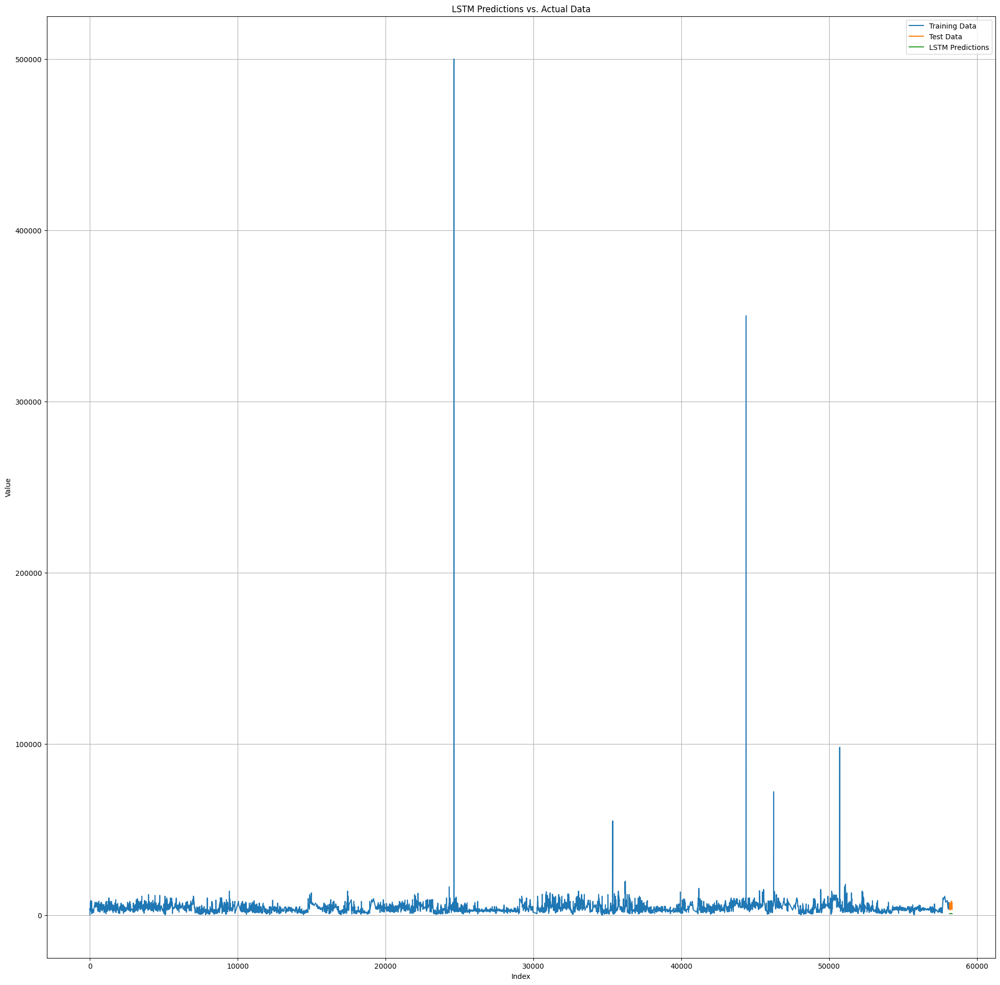

In [ ]:
# y_train.plot(legend=True, figsize=(24, 24), label='Training Data')
# y_test.plot(legend=True, label='Test Data')

# y_pred_lstm.plot(legend=True, label='LSTM Predictions');

import matplotlib.pyplot as plt
plt.figure(figsize=(24, 24))
plt.plot(y_train.index, y_train.values, label='Training Data')
plt.plot(y_test.index, y_test.values, label='Test Data')
plt.plot(y_test.index, y_pred_lstm, label='LSTM Predictions')

plt.legend()
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('LSTM Predictions vs. Actual Data')
plt.grid(True)
plt.show()

## 4.7 FB - Prophet

In [ ]:
! pip install -q condacolab

In [ ]:
import condacolab
condacolab.install()

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.11.0-0/Mambaforge-23.11.0-0-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:18
🔁 Restarting kernel...


In [ ]:
! mamba install prophet


Looking for: ['prophet']

[+] 0.0s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  [+] 0.1s
conda-forge/linux-64   1%
conda-forge/noarch    ⣾  [+] 0.2s
conda-forge/linux-64  11%
conda-forge/noarch    14%[+] 0.3s
conda-forge/linux-64  21%
conda-forge/noarch    38%[+] 0.4s
conda-forge/linux-64  31%
conda-forge/noarch    61%[+] 0.5s
conda-forge/linux-64  36%
conda-forge/noarch    73%[+] 0.6s
conda-forge/linux-64  41%
conda-forge/noarch    96%conda-forge/noarch                                
[+] 0.7s
conda-forge/linux-64  51%[+] 0.8s
conda-forge/linux-64  61%[+] 0.9s
conda-forge/linux-64  71%[+] 1.0s
conda-forge/linux-64  80%conda-forge/linux-64                              

Pinned packages:
  - python 3.10.*
  - python 3.10.*
  - python_abi 3.10.* *cp310*
  - cuda-version 12.*


Transaction

  Prefix: /usr/local

  Updating specs:

   - prophet
   - ca-certificates
   - certifi
   - openssl


  Package                        Version  Build                  Channel           Size
───

In [ ]:
! pip install prophet

import prophet

In [ ]:
df = orange_2018_2022_[['arrival_date', 'modal_price']]
df.columns = ['ds', 'y']
df['ds'] = pd.to_datetime(df['ds'])
df.tail()

<ipython-input-73-fcd2a2fe0286>:3: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['ds'] = pd.to_datetime(df['ds'])
<ipython-input-73-fcd2a2fe0286>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ds'] = pd.to_datetime(df['ds'])


,ds,y
58324,2022-12-29,5400.0
58325,2022-12-29,3400.0
58326,2022-12-30,6400.0
58327,2022-12-30,5400.0
58328,2022-12-30,3400.0


In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet

prop = Prophet()

prop.fit(df)

future = prop.make_future_dataframe(periods = 84)
forecast = prop.predict(future)

07:00:48 - cmdstanpy - INFO - Chain [1] start processing
07:01:05 - cmdstanpy - INFO - Chain [1] done processing


<Axes: xlabel='ds'>

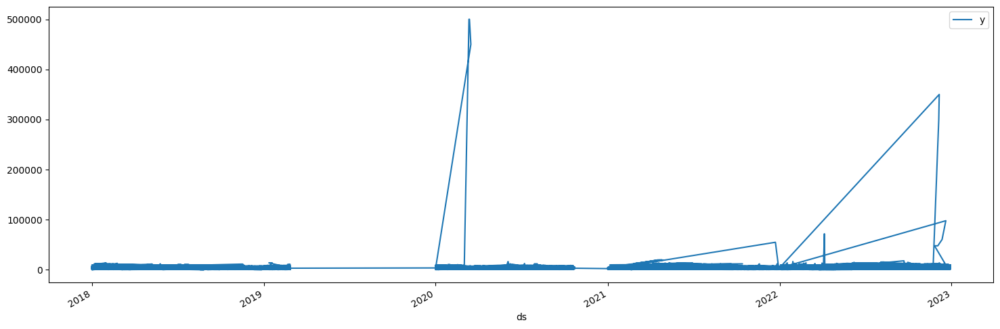

In [ ]:
df.plot(x='ds',y='y',figsize=(18,6))

In [ ]:
train = df.iloc[:len(df) - 84]
test = df.iloc[len(df) - 84:]

In [ ]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1521,2023-03-20,4662.951418,-1419.507566,10432.979276
1522,2023-03-21,4633.443535,-1113.039783,11082.891686
1523,2023-03-22,4624.681668,-1623.803225,10926.737061
1524,2023-03-23,4606.599827,-1659.184041,10646.070704
1525,2023-03-24,4620.055832,-1381.806588,10225.566006


In [ ]:
test.tail()

,ds,y
58324,2022-12-29,5400.0
58325,2022-12-29,3400.0
58326,2022-12-30,6400.0
58327,2022-12-30,5400.0
58328,2022-12-30,3400.0


In [ ]:
plot_plotly(prop, forecast)

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [ ]:
plot_components_plotly(prop, forecast)

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [ ]:
from statsmodels.tools.eval_measures import rmse

predictions = forecast.iloc[-84:]['yhat']
# print("RMSE (actual vs  predicted):", rmse(predictions, test['y']))
print(len(test['y']), len(predictions))
print("Mean Value of Test Dataset:", test['y'].mean())
print(prop, '\nMAE:', mean_absolute_error(predictions, test['y']), '\nMSE:', mean_squared_error(predictions, test['y']), '\nRMSE:', mean_squared_error(predictions, test['y'], squared = False))

84 84
Mean Value of Test Dataset: 6290.476190476191
MAE: 2204.7950549477873 
MSE: 6012436.596726843 
RMSE: 2452.02703833519


In [ ]:
# print(X_test, y_test)

In [ ]:
# start = X_test.index[0]
# end = X_test.index[-1]
# if start > end:
#     start, end = end, start
# y_pred_arima = arima.predict(start = start, end = end).rename('ARIMA Predictions')

In [ ]:
# print(arima, '\nMAE:', mean_absolute_error(y_test, y_pred_arima), '\nMSE:', mean_squared_error(y_test, y_pred_arima), '\nRMSE:', mean_squared_error(y_test, y_pred_arima, squared = False))

In [ ]:
# y_train.plot(legend=True, figsize=(24, 24), label='Training Data')
# y_test.plot(legend=True, label='Test Data')

# y_pred_arima.plot(legend=True, label='ARIMA Predictions');
# # predictions.plot(legend = True)
# # test['modal_price'].plot(legend = True)

## 4.8 Convolutional Neural Networks

In [ ]:
! pip install --user tensorflow
! pip install --user keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 90.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 83.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 71.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 92.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 88.

In [ ]:
! pip show keras

Name: keras
Version: 3.1.1
Summary: Multi-backend Keras.
Home-page: https://github.com/keras-team/keras
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache License 2.0
Location: /root/.local/lib/python3.10/site-packages
Requires: absl-py, h5py, ml-dtypes, namex, numpy, optree, rich
Required-by: tensorflow


In [ ]:
import keras
import tensorflow as tf
from keras.models import Sequential, Model
# from keras.layers.convolutional import Conv1D, MaxPooling1D
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Flatten, Dropout

epochs = 100
batch = 256
learning_rate = 0.0003
adam = tf.keras.optimizers.Adam(learning_rate)

cnn = Sequential()
cnn.add(Conv1D(filters = 64, kernel_size = 8, activation = 'relu', input_shape = (X_train.shape[0], X_train.shape[1])))
cnn.add(MaxPooling1D(pool_size = 4))
cnn.add(Flatten())
cnn.add(Dense(50, activation='relu'))
cnn.add(Dropout(0.2))
cnn.add(Dense(1))
cnn.compile(loss='mse', optimizer=adam)
cnn.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 21496, 64)         576       
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 5374, 64)          0         
 g1D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 343936)            0         
                                                                 
 dense_3 (Dense)             (None, 50)                17196850  
                                                                 
 dropout_1 (Dropout)         (None, 50)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 51        
                                                      

In [ ]:
from keras.callbacks import EarlyStopping

# X_train = X_train.to_numpy()
X_train = X_train.reshape((X_train.shape[0], X_train.shape[2], X_train.shape[1]))
monitor = EarlyStopping(monitor = 'val_loss', min_delta = 1e-3, patience = 50, verbose = 1, mode = 'auto', restore_best_weights = True)

X_validation, y_validation = X_train[:][-400:], y_train[:][-400:]
cnn_history = cnn.fit(X_train, y_train, callbacks = [monitor], validation_data = (X_validation, y_validation), epochs = epochs, verbose = 2)

Epoch 1/100


ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1150, in train_step
        y_pred = self(x, training=True)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_3" is incompatible with the layer: expected shape=(None, 21503, 1), found shape=(None, 10, 1)


In [ ]:
print(cnn, '\nMAE:', mean_absolute_error(y_test, y_pred_arima), '\nMSE:', mean_squared_error(y_test, y_pred_arima), '\nRMSE:', mean_squared_error(y_test, y_pred_arima, squared = False))

In [ ]:
y_train.plot(legend=True, figsize=(24, 24), label='Training Data')
y_test.plot(legend=True, label='Test Data')

y_pred_arima.plot(legend=True, label='ARIMA Predictions');
# predictions.plot(legend = True)
# test['modal_price'].plot(legend = True)

# **5. Training**

## 5.1 Consolidating Pipelines

In [ ]:
# pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_adaboost, pipeline_mlp]

# pipes = {
#             0: 'Logistic Regression',
# }

## 5.2 Fitting Models

In [ ]:
# for pipe in pipelines:
#     pipe.fit(X_train, y_train)

## 5.3 Scoring of Models

### 5.3.1 MSE

# **6. Hyperparameter Tuning**

## 6.1 Importing GridSearchCV

In [ ]:
# from sklearn.model_selection import GridSearchCV

## 6.2 Creating a pipeline fot GridSearchCV

In [ ]:
# # creating a pipeline object
# pipe = Pipeline([('classifier', RandomForestClassifier())])

# # creating a dictionary with candidate learning algorithms and their hyperparameters
# grid_parameters = [
#                     {
#                         'classifier': [LinearRegression()],
#                         'classifier__max_iter': [10000, 100000],
#                         'classifier__penalty': ['l1', 'l2'],
#                         'classifier__C': np.logspace(0, 4, 10),
#                         'classifier__solver': ['newton-cg', 'saga', 'sag', 'liblinear']
#                     },
#                     {
#                         'classifier': [RandomForestClassifier()],
#                         'classifier__n_estimators': [10, 100, 1000],
#                         'classifier__min_samples_leaf': [2, 5, 10, 15, 100],
#                         'classifier__max_leaf_nodes': [2, 5, 10, 20],
#                         'classifier__max_depth': [None, 1, 2, 5, 8, 15, 25, 30]

#                     },
#                     {
#                         'classifier': [AdaBoostClassifier()],
#                         'classifier__n_estimators': [100, 1000],
#                         'classifier__learning_rate': [0.001, 0.01],
#                         'classifier__random_state': [1127]
#                     },
#                     {
#                         'classifier': [VotingClassifier()],
#                         'classifier__voting': ['hard', 'soft']
#                     },
#                     {
#                         'classifier': [MLPClassifier()],
#                         'classifier__hidden_layer_sizes': [(100, ), (1000,)],
#                         'classifier__activation': ['identity', 'logistic', 'tanh', 'relu'],
#                         'classifier__solver': ['lbfgs', 'sgd', 'adam'],
#                         'classifier__learning_rate': ['constant', 'invscaling', 'adaptive'],
#                         'classifier__max_iter': [200, 1000, 10000]
#                     },
#                 ]



# grid_search = GridSearchCV(pipe, grid_parameters, cv = 4, verbose = 0, n_jobs = -1)
# best_model = grid_search.fit(X_train, y_train)


# print(best_model.best_estimator_)
# print("The mean accuracy of the model is: ", best_model.score(X_test, y_test))

## 6.3 Creating GridSearchCV

In [ ]:
# grid_search = GridSearchCV(pipe, grid_parameters, cv = 4, verbose = 0, n_jobs = -1)
# best_model = grid_search.fit(X_train, y_train)

## 6.4 Fitting best parameters

In [ ]:
# print(best_model.best_estimator_)
# print("The mean accuracy of the model is: ", best_model.score(X_test, y_test))

# Pipeline(steps=[('classifier',
#                 RandomForestClassifier(max_depth=5, max_leaf_nodes=10,
#                 min_samples_leaf=15))])
# The mean accuracy of the model is:  0.6709633649932157

# Pipeline(steps=[('classifier',
#                 AdaBoostClassifier(learning_rate=0.01, n_estimators=1000,
#                 random_state=1127))])
# The mean accuracy of the model is:  0.6811397557666214

## 6.5 Calculating scores of best parameters

### 6.5.2 Cross Validation